<a href="https://colab.research.google.com/github/nahidsami/nahidsami/blob/main/u_net_drive.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro
by: Nahid Sami

This notebook will be a sequence of experiments in which tried to replicate some articles found that use the U-Net architecture to perform segmentation on DRIVE (digital retinal images for vessel extraction) dataset. This is a part of deep learning model development during my PhD.


Support and setup codes
In this section I implemented some methods that will be reused in the experiments.

# Exploratory Data Analysis

In [ ]:
import glob
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array
from numpy import expand_dims
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from PIL import Image
import numpy as np

%matplotlib inline
images_main_path = "/kaggle/input/drive2004/DRIVE"

images_path = {}
for typ in ["images", "1st_manual"]:
    images_path[typ] = {}
    for stat in ["training", "test"]:
        images_path[typ][stat] = sorted(glob.glob(f"{images_main_path}/{stat}/{typ}/*.[tg]if"))

def load_image(filename):
    pixels = np.array(Image.open(filename))
    pixels = ((pixels - 127.5) / 127.5)+1/2
    return pixels

def display(display_list):
    plt.figure(figsize=(10, 10))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i, image in enumerate(display_list):
        if image is None:
            continue
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        cmap = None
        if i > 0:
            cmap = plt.cm.gray
        plt.imshow(image, cmap=cmap)
        plt.axis('off')
    plt.show()

def plot_images(stat: str, i: int) -> None:
    images = []
    image = load_image(images_path["images"][stat][i])
    images.append(image)
    if stat != "test":
        mask = load_image(images_path["1st_manual"][stat][i])
        images.append(mask)
    display(images)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


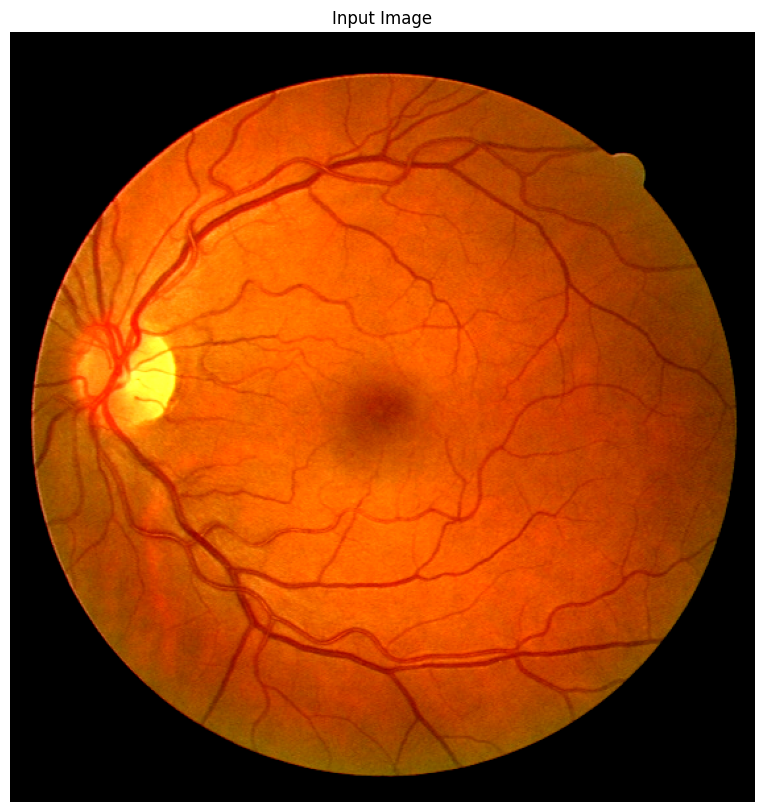

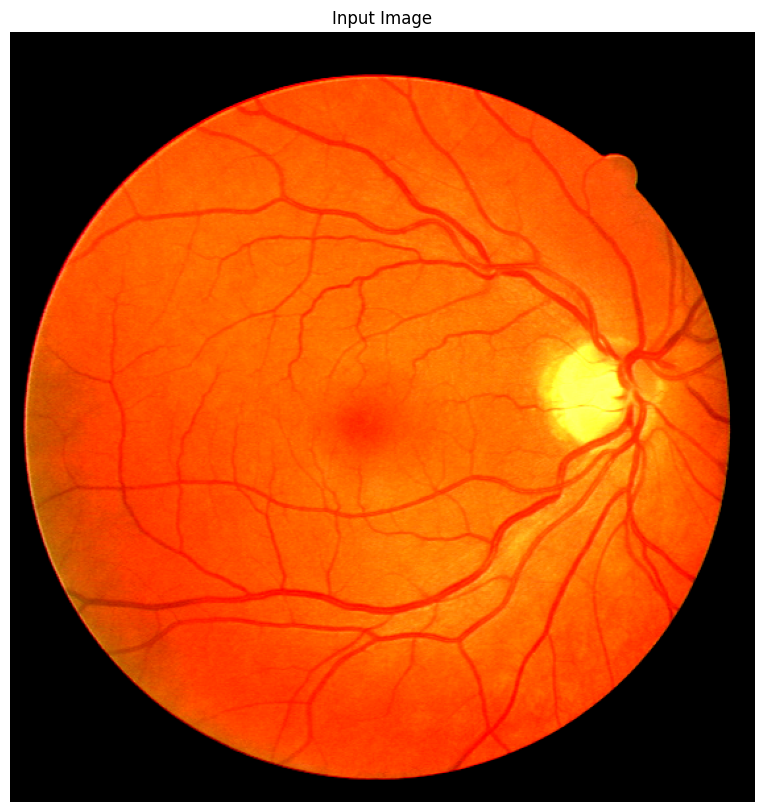

In [ ]:
for i in range(2):
    plot_images("test", i)

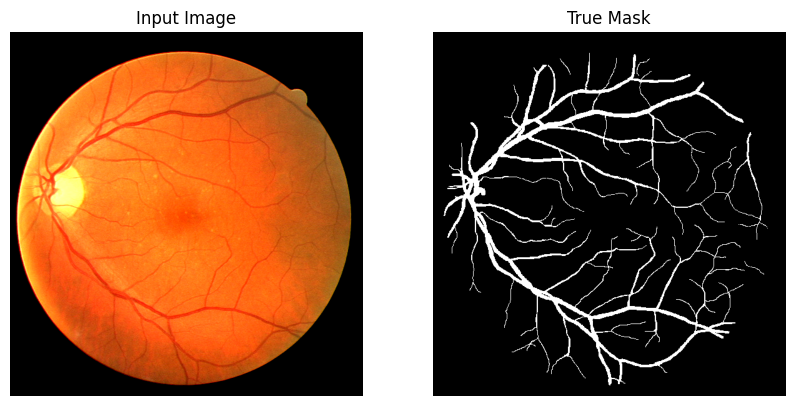

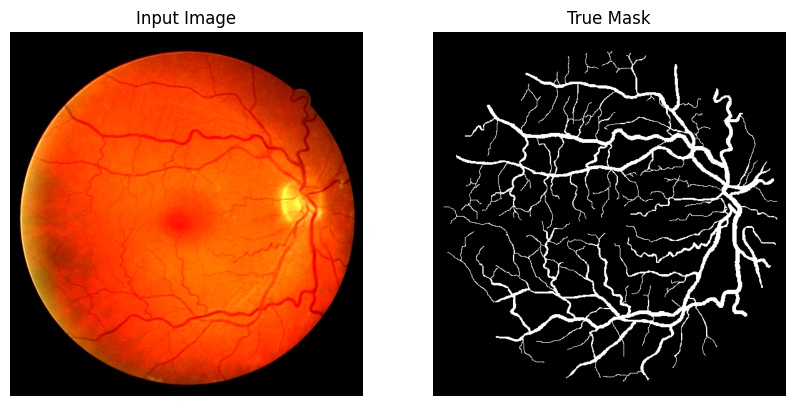

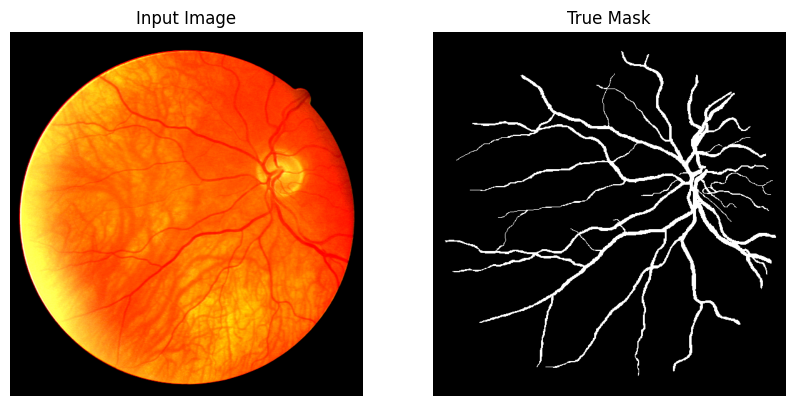

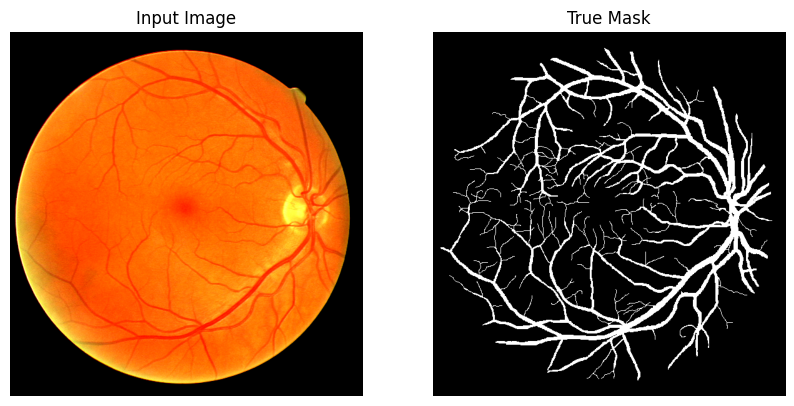

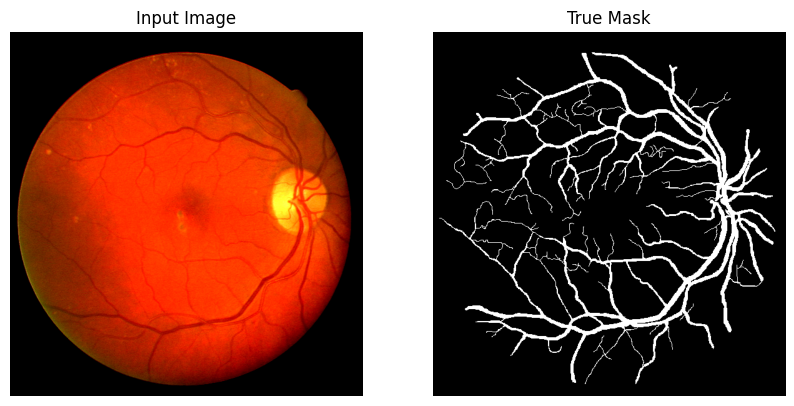

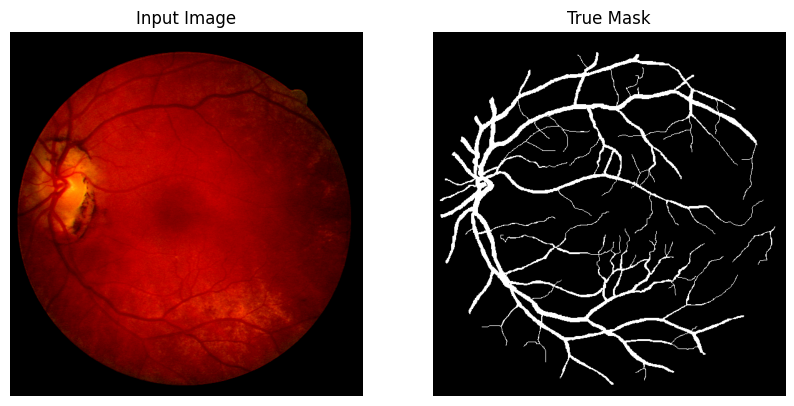

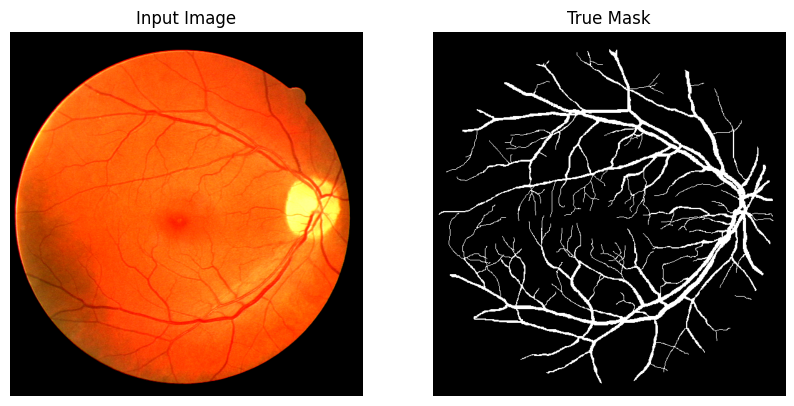

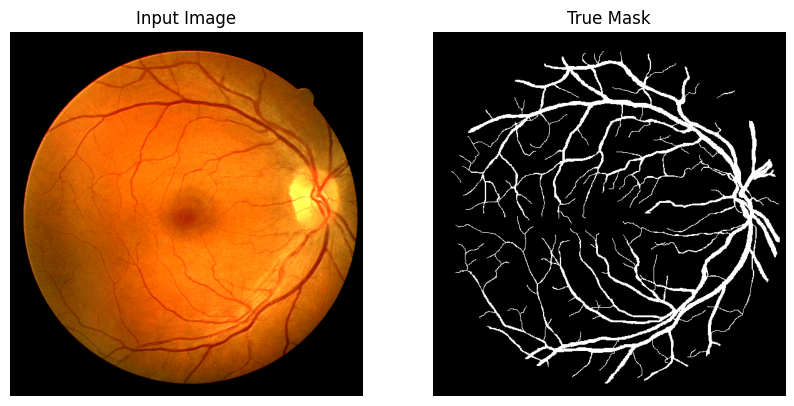

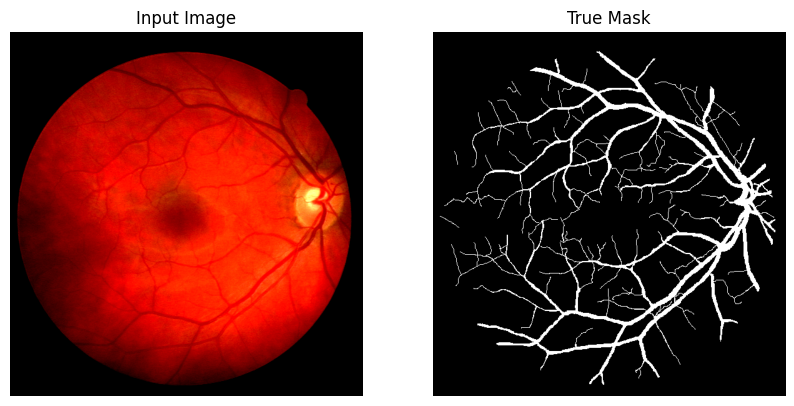

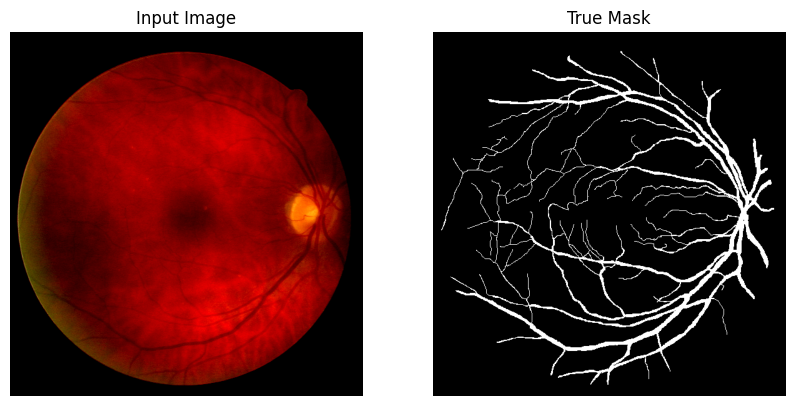

In [ ]:
for i in range(10):
    plot_images("training", i)

### Replication of the experiment

In [ ]:
%%script bash
rm -rf pytorch-unet-for-retina-vessel-segmentation
git clone https://github.com/jzsherlock4869/pytorch-unet-for-retina-vessel-segmentation.git
cd pytorch-unet-for-retina-vessel-segmentation \
    && git reset --hard 8a0d2026088da28625d400db4c37cbf429693324 \
    && git clean -df

Cloning into 'pytorch-unet-for-retina-vessel-segmentation'...


HEAD is now at 8a0d202 Update README.md


This is the code replication presented in the official Tensorflow Image Segmentation doc. The U-net network is composed of a decoder and an image encoder, in the tensorflow documentation they recommend using each one from a previously trained training.

The image decoder will be the original pix2pix from the publication below:

Isola, Phillip, Jun-Yan Zhu, Tinghui Zhou, and Alexei A. Efros. "Image-to-image translation with conditional adversarial networks." In Proceedings of the IEEE conference on computer vision and pattern recognition, pp. 1125-1134. 2017.

The encoder will be the original Mobilenetv2 from the publication below:

Sandler, Mark, Andrew Howard, Menglong Zhu, Andrey Zhmoginov, and Liang-Chieh Chen. "Mobilenetv2: Inverted residuals and linear bottlenecks." In Proceedings of the IEEE conference on computer vision and pattern recognition, pp. 4510-4520. 2018.

In [ ]:
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-eaj1tton
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/examples.git /tmp/pip-req-build-eaj1tton
  Resolved https://github.com/tensorflow/examples.git to commit d639fe4b394c391dfdf6d00171cfa916a7fc1175
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-examples: filename=tensorflow_examples-0.1698779193.1223017319550583858672544386243344910876866777461-py3-none-any.whl size=301584 sha256=b49ff1ab44c7603257ed240b148b4cf6ca3fa3f08ef214801b62268cd317d104
  Stored in directory: /tmp/pip-ephem-wheel-cache-a0aca1sr/wheels/72/5f/d0/7fe769eaa229bf20101d11a357eb23c83c481bee2d7f710599
Successfully built tensorflow-examples


In [ ]:
from pathlib import Path

import tensorflow as tf
import tensorflow_io as tfio

def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    input_mask = (input_mask // 255)
    return input_image, input_mask

def load_image(datapoint):
    input_image = tf.image.resize(datapoint['image'], (256, 256))
    input_mask = tf.image.resize(
        datapoint['segmentation_mask'],
        (256, 256),
        method = tf.image.ResizeMethod.NEAREST_NEIGHBOR,
    )
    input_image, input_mask = normalize(input_image, input_mask)
    input_mask = input_mask[0][ :, :, 0]
    input_mask = tf.expand_dims(input_mask, -1)
    return input_image, input_mask

def parse_image(img_path: str, mask_path:str):
    image = tf.io.read_file(img_path)
    image = tfio.experimental.image.decode_tiff(image)
    image = tf.image.convert_image_dtype(image, tf.uint8)
    r, g, b = image[:, :, 0], image[:, :, 1], image[:, :, 2]
    image = tf.stack([r, g, b], axis=-1)
    mask = tf.io.read_file(mask_path)
    mask = tf.io.decode_gif(mask)
    return {'image': image, 'segmentation_mask': mask}

class Augment(tf.keras.layers.Layer):
    def __init__(self, seed=42):
        super().__init__()
        # both use the same seed, so they'll make the same random changes.
        self.augment_inputs = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
        self.augment_labels = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)

    def call(self, inputs, labels):
        inputs = self.augment_inputs(inputs)
        labels = self.augment_labels(labels)
        return inputs, labels

training_images_main_path = Path("/kaggle/input/drive2004/DRIVE/training/images")
training_label_main_path = Path("/kaggle/input/drive2004/DRIVE/training/1st_manual")
test_images_main_path = Path("/kaggle/input/drive2004/DRIVE/test/images")
test_label_main_path = Path("/kaggle/input/drive2004/DRIVE/test/1st_manual")
window_size_x = 3
window_size_y = 2
shift_size = 1
training_images = tf.data.Dataset.list_files(str(training_images_main_path/'*'), shuffle=False) # .window(window_size_x, shift=shift_size, drop_remainder=True).flat_map(lambda x: x.batch(window_size_x))
training_labels = tf.data.Dataset.list_files(str(training_label_main_path/'*'), shuffle=False) # .window(window_size_y, shift=shift_size, drop_remainder=True).flat_map(lambda x: x.batch(window_size_y))
test_images = tf.data.Dataset.list_files(str(test_images_main_path/'*'), shuffle=False) # .window(window_size_x, shift=shift_size, drop_remainder=True).flat_map(lambda x: x.batch(window_size_x))
test_labels = tf.data.Dataset.list_files(str(test_label_main_path/'*'), shuffle=False) # .window(window_size_y, shift=shift_size, drop_remainder=True).flat_map(lambda x: x.batch(window_size_y))
dataset = tf.data.Dataset.zip((training_images, training_labels))
testdataset = tf.data.Dataset.zip((test_images, test_labels))

images = dataset.map(parse_image, num_parallel_calls=tf.data.AUTOTUNE)
train_images = images.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)

Testimages = testdataset.map(parse_image, num_parallel_calls=tf.data.AUTOTUNE)
testt_images = Testimages.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)

TRAIN_LENGTH = len(dataset)
BATCH_SIZE = 4
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

train_batches = (
    train_images
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = (
    testt_images
#     .batch(BATCH_SIZE)
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))


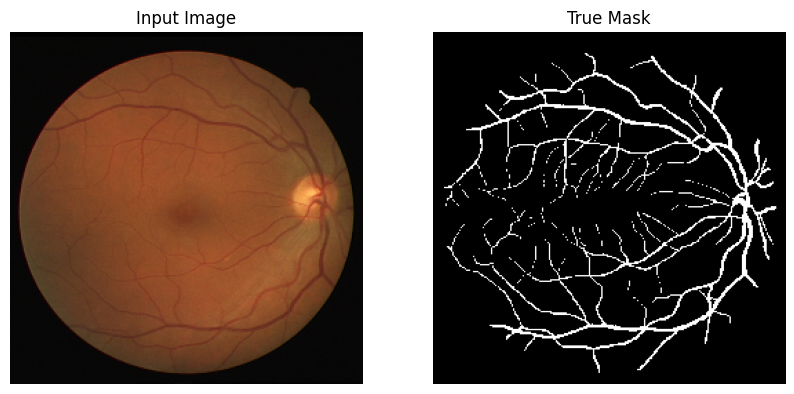

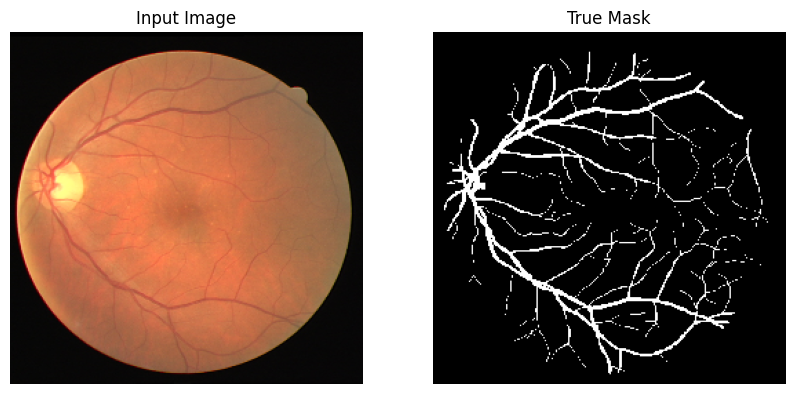

In [ ]:
import matplotlib.pyplot as plt


for images, masks in train_batches.take(2):
    sample_image, sample_mask = images[0], masks[0]
    display([sample_image, sample_mask])

9406464/9406464 [==============================] - 1s 0us/step


/opt/conda/lib/python3.10/site-packages/tensorflow/python/data/ops/structured_function.py:254: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 5s 5s/step


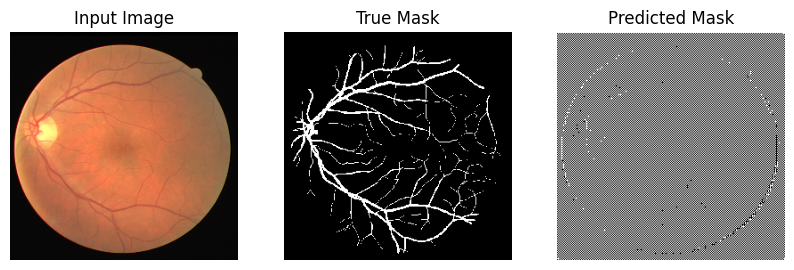

In [ ]:
import tensorflow.compat.v1 as tf

from tensorflow_examples.models.pix2pix import pix2pix
from tensorflow.keras.metrics import Accuracy, Recall, Precision, MeanIoU, BinaryAccuracy, IoU
from sklearn.metrics import confusion_matrix
from tensorflow.keras.optimizers import Adam

tf.config.run_functions_eagerly(True)

base_model = tf.keras.applications.MobileNetV2(input_shape=[256, 256, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]


def cal_mean_iou(num_classes):

    def MIOU(y_true, y_pred):
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(tf.argmax(y_pred, axis=-1), [-1])
#         print(f'y_true:{len(y_true[y_true==y_pred])}')
#         num_need_labels = num_classes
#         confusionmatrix = confusion_matrix(y_true, y_pred)
#         intersect = tf.diag_part(confusionmatrix)
#         union = tf.reduce_sum(confusionmatrix, axis=0) + tf.reduce_sum(confusionmatrix, axis=1) - intersect
#         iou = tf.div_no_nan(tf.cast(intersect, tf.float32), tf.cast(union, tf.float32))
#         num_valid_entries = tf.reduce_sum(tf.cast(tf.not_equal(union, 0), dtype=tf.float32))
#         num = tf.minimum(num_valid_entries, num_need_labels)
#         mean_iou = tf.div_no_nan(tf.reduce_sum(iou), num)
        hist = confusion_matrix(y_true, y_pred)
        mean_iou = np.diag(hist) / (hist.sum(1) + hist.sum(0) - np.diag(hist))
        mean_iou = np.nanmean(mean_iou)
        return mean_iou

    return MIOU




def unet_model(output_channels:int):
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Downsampling through the model
    skips = down_stack(inputs)
    x = skips[-1]
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

    # This is the last layer of the model
    last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=2, strides=2,
      padding='same')  #64x64 -> 128x128

    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

OUTPUT_CLASSES = 2

model = unet_model(output_channels=OUTPUT_CLASSES)
model.compile(optimizer=Adam(1e-3),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=[cal_mean_iou(2),'accuracy'])

def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
#     pred_mask = (pred_mask > 0.5) * 1
#     pred_mask = pred_mask[..., tf.newaxis]
#     pred_mask = tf.squeeze(pred_mask, axis=-1)[0]
    return pred_mask[0]

def show_predictions(dataset=None, num=1):
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = create_mask(model.predict(image))
            display([image[0], mask[0], pred_mask])
    else:
        pred_mask = create_mask(model.predict(sample_image[tf.newaxis, ...]))
        display([sample_image, sample_mask, pred_mask])

show_predictions()

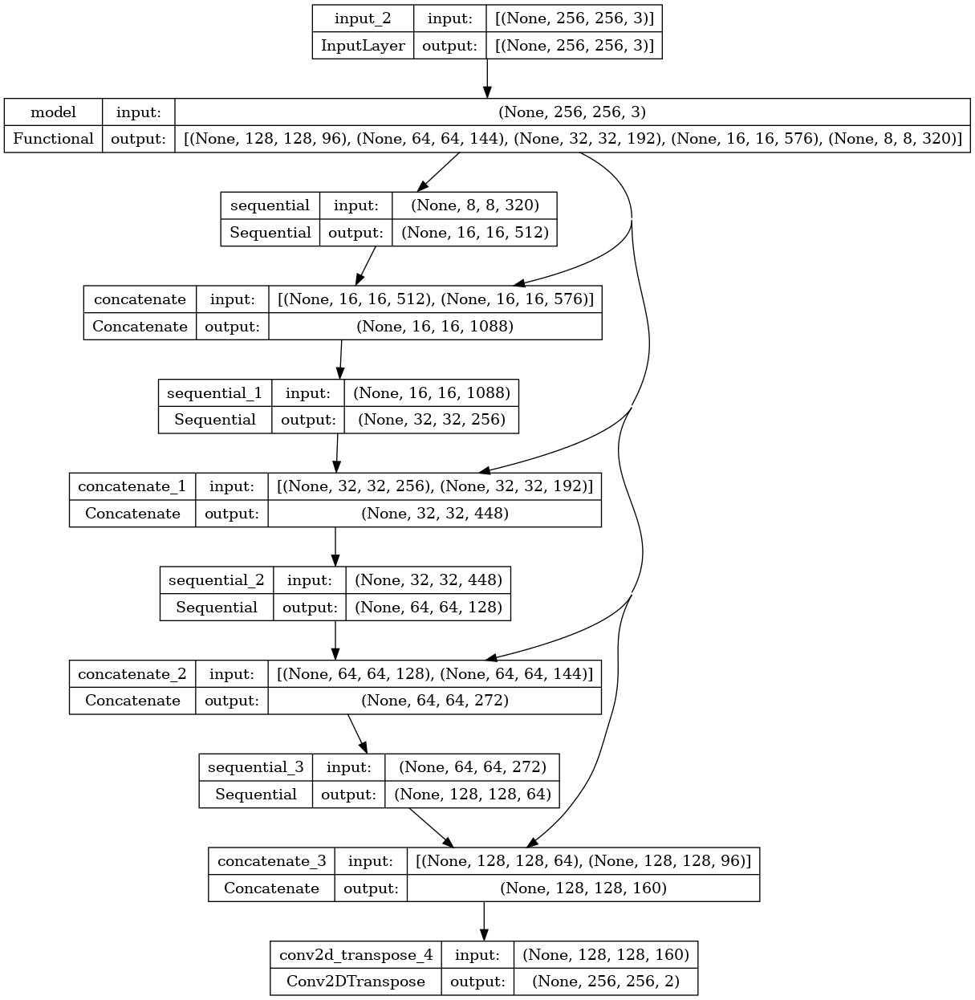

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True)

VALIDATION_STEPS -  2
Epoch 1/60
1/1 [==============================] - 0s 117ms/step


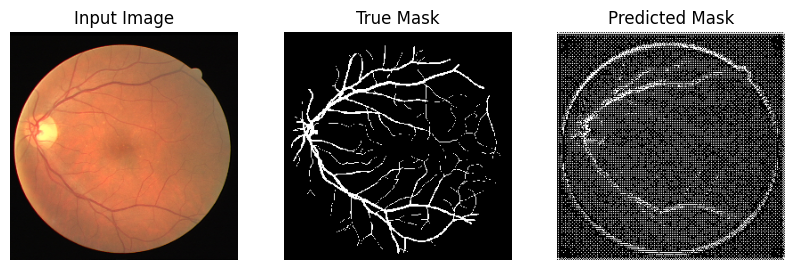


Sample Prediction after epoch 1

5/5 [==============================] - 52s 10s/step - loss: 0.1880 - MIOU: 0.3425 - accuracy: 0.6123 - val_loss: 0.5069 - val_MIOU: 0.4133 - val_accuracy: 0.7432
Epoch 2/60
1/1 [==============================] - 0s 114ms/step


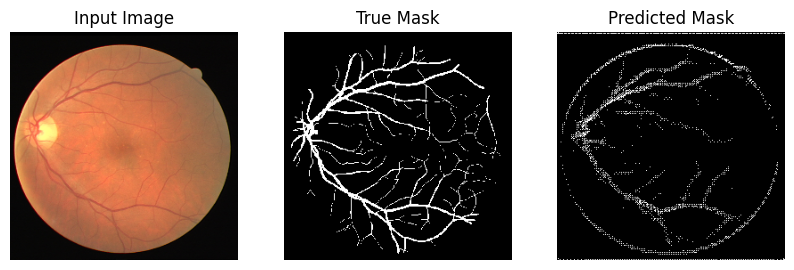


Sample Prediction after epoch 2

5/5 [==============================] - 46s 10s/step - loss: 0.1279 - MIOU: 0.5183 - accuracy: 0.8487 - val_loss: 0.3536 - val_MIOU: 0.5110 - val_accuracy: 0.8987
Epoch 3/60
1/1 [==============================] - 0s 115ms/step


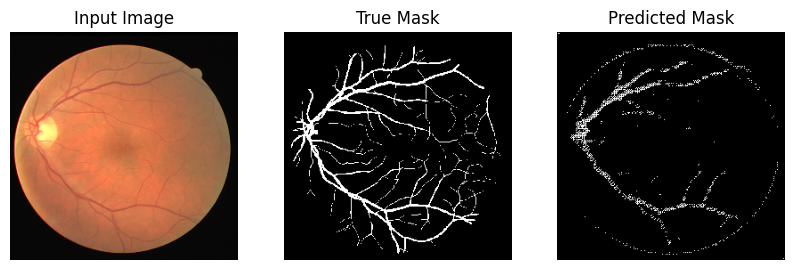


Sample Prediction after epoch 3

5/5 [==============================] - 46s 10s/step - loss: 0.1084 - MIOU: 0.5810 - accuracy: 0.9078 - val_loss: 0.2871 - val_MIOU: 0.5303 - val_accuracy: 0.9154
Epoch 4/60
1/1 [==============================] - 0s 112ms/step


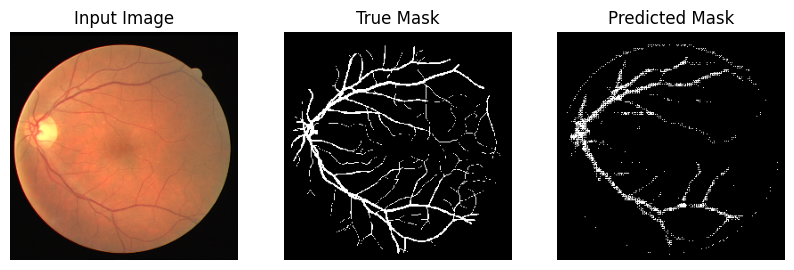


Sample Prediction after epoch 4

5/5 [==============================] - 46s 10s/step - loss: 0.0976 - MIOU: 0.6225 - accuracy: 0.9172 - val_loss: 0.2567 - val_MIOU: 0.5749 - val_accuracy: 0.9220
Epoch 5/60
1/1 [==============================] - 0s 115ms/step


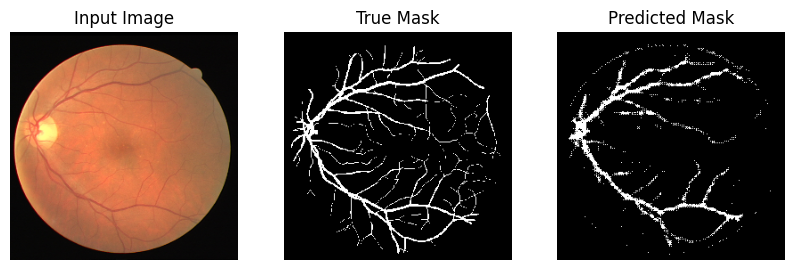


Sample Prediction after epoch 5

5/5 [==============================] - 46s 10s/step - loss: 0.0896 - MIOU: 0.6483 - accuracy: 0.9185 - val_loss: 0.2417 - val_MIOU: 0.6182 - val_accuracy: 0.9268
Epoch 6/60
1/1 [==============================] - 0s 111ms/step


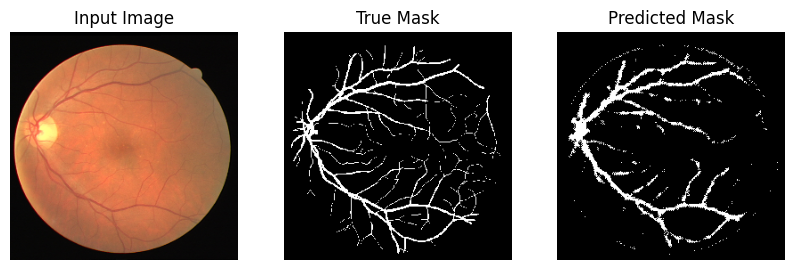


Sample Prediction after epoch 6

5/5 [==============================] - 46s 10s/step - loss: 0.0843 - MIOU: 0.6558 - accuracy: 0.9150 - val_loss: 0.2417 - val_MIOU: 0.6636 - val_accuracy: 0.9302
Epoch 7/60
1/1 [==============================] - 0s 116ms/step


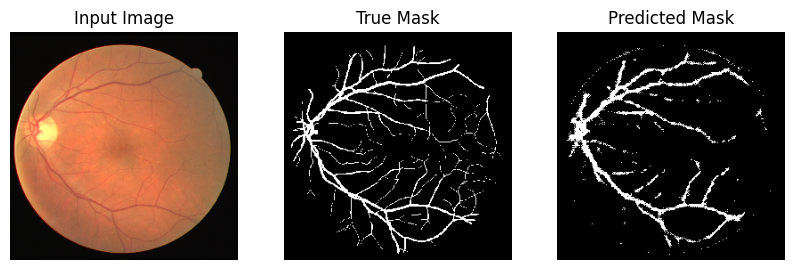


Sample Prediction after epoch 7

5/5 [==============================] - 45s 10s/step - loss: 0.0804 - MIOU: 0.6599 - accuracy: 0.9136 - val_loss: 0.2246 - val_MIOU: 0.6789 - val_accuracy: 0.9347
Epoch 8/60
1/1 [==============================] - 0s 115ms/step


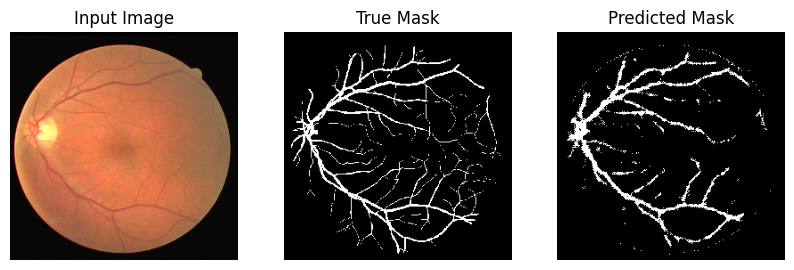


Sample Prediction after epoch 8

5/5 [==============================] - 45s 10s/step - loss: 0.0777 - MIOU: 0.6682 - accuracy: 0.9172 - val_loss: 0.2158 - val_MIOU: 0.6798 - val_accuracy: 0.9356
Epoch 9/60
1/1 [==============================] - 0s 117ms/step


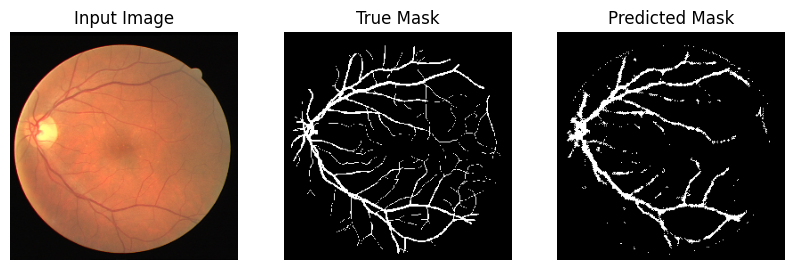


Sample Prediction after epoch 9

5/5 [==============================] - 46s 10s/step - loss: 0.0754 - MIOU: 0.6740 - accuracy: 0.9194 - val_loss: 0.2103 - val_MIOU: 0.6819 - val_accuracy: 0.9373
Epoch 10/60
1/1 [==============================] - 0s 114ms/step


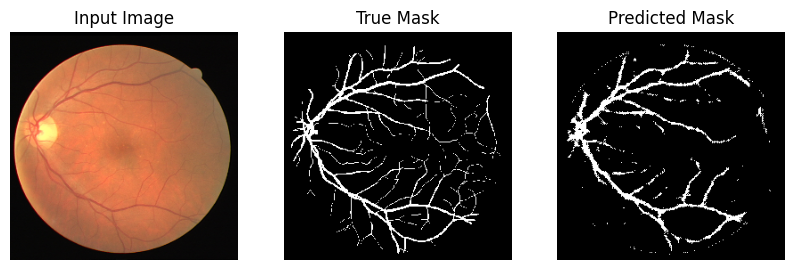


Sample Prediction after epoch 10

5/5 [==============================] - 46s 10s/step - loss: 0.0735 - MIOU: 0.6773 - accuracy: 0.9202 - val_loss: 0.2118 - val_MIOU: 0.6903 - val_accuracy: 0.9362
Epoch 11/60
1/1 [==============================] - 0s 114ms/step


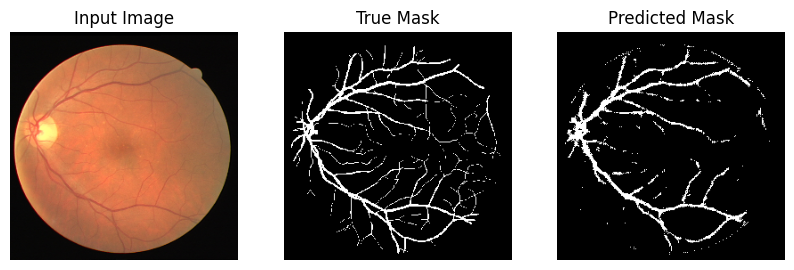


Sample Prediction after epoch 11

5/5 [==============================] - 46s 10s/step - loss: 0.0718 - MIOU: 0.6822 - accuracy: 0.9217 - val_loss: 0.1987 - val_MIOU: 0.6952 - val_accuracy: 0.9391
Epoch 12/60
1/1 [==============================] - 0s 111ms/step


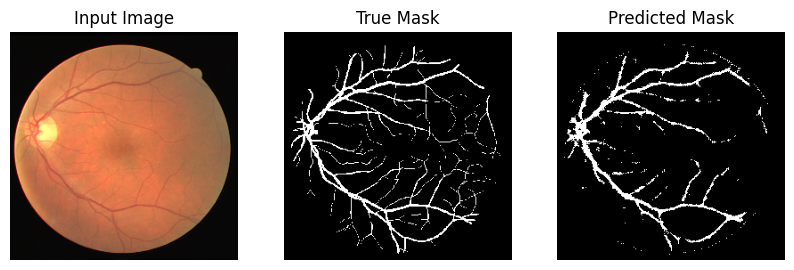


Sample Prediction after epoch 12

5/5 [==============================] - 46s 10s/step - loss: 0.0703 - MIOU: 0.6881 - accuracy: 0.9244 - val_loss: 0.1910 - val_MIOU: 0.6934 - val_accuracy: 0.9407
Epoch 13/60
1/1 [==============================] - 0s 109ms/step


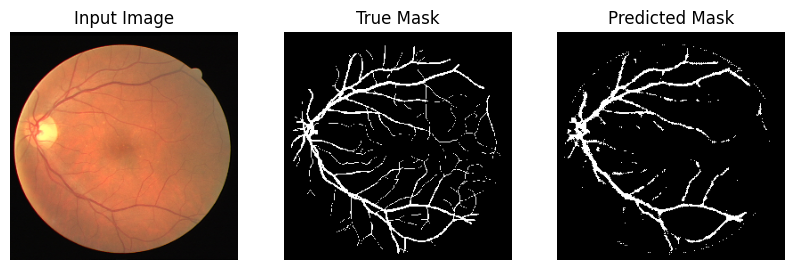


Sample Prediction after epoch 13

5/5 [==============================] - 46s 10s/step - loss: 0.0691 - MIOU: 0.6905 - accuracy: 0.9247 - val_loss: 0.1883 - val_MIOU: 0.7106 - val_accuracy: 0.9426
Epoch 14/60
1/1 [==============================] - 0s 115ms/step


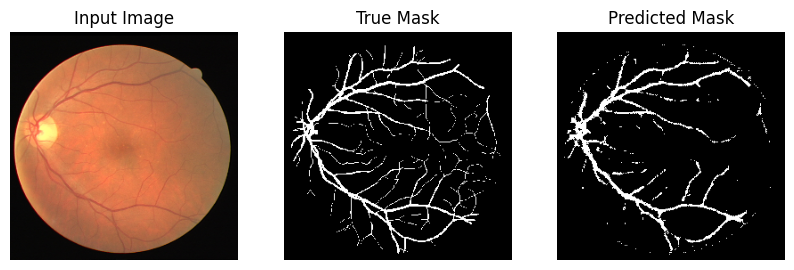


Sample Prediction after epoch 14

5/5 [==============================] - 46s 10s/step - loss: 0.0680 - MIOU: 0.6942 - accuracy: 0.9264 - val_loss: 0.1894 - val_MIOU: 0.7105 - val_accuracy: 0.9427
Epoch 15/60
1/1 [==============================] - 0s 111ms/step


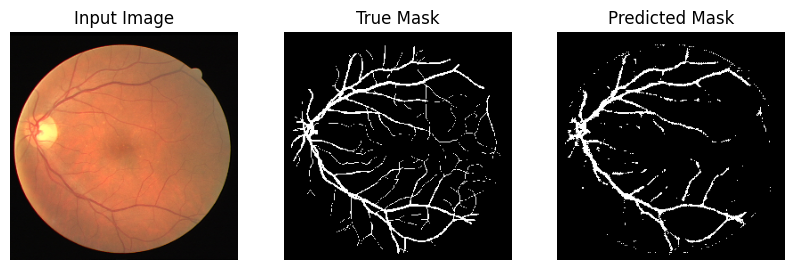


Sample Prediction after epoch 15

5/5 [==============================] - 46s 10s/step - loss: 0.0669 - MIOU: 0.6979 - accuracy: 0.9271 - val_loss: 0.1853 - val_MIOU: 0.7120 - val_accuracy: 0.9445
Epoch 16/60
1/1 [==============================] - 0s 114ms/step


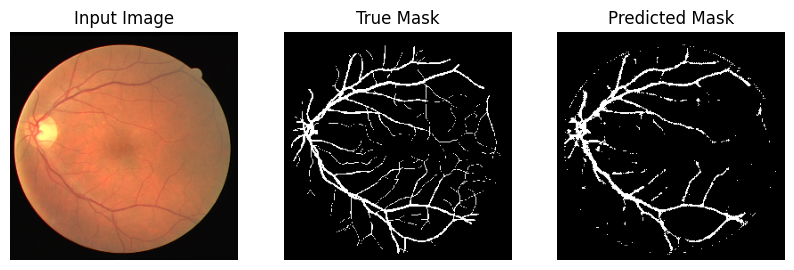


Sample Prediction after epoch 16

5/5 [==============================] - 46s 10s/step - loss: 0.0660 - MIOU: 0.7004 - accuracy: 0.9281 - val_loss: 0.1840 - val_MIOU: 0.7072 - val_accuracy: 0.9445
Epoch 17/60
1/1 [==============================] - 0s 123ms/step


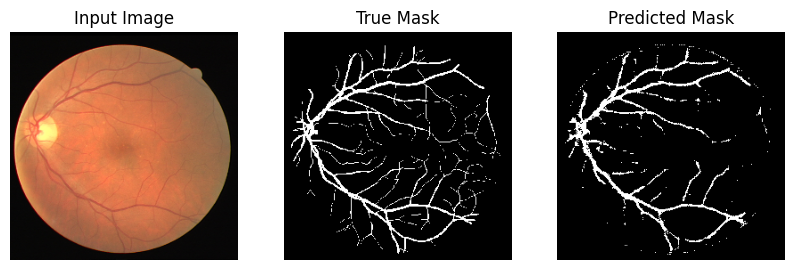


Sample Prediction after epoch 17

5/5 [==============================] - 46s 10s/step - loss: 0.0647 - MIOU: 0.7033 - accuracy: 0.9291 - val_loss: 0.1806 - val_MIOU: 0.7148 - val_accuracy: 0.9472
Epoch 18/60
1/1 [==============================] - 0s 113ms/step


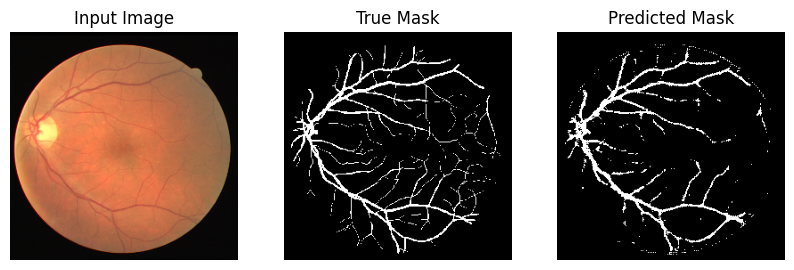


Sample Prediction after epoch 18

5/5 [==============================] - 45s 10s/step - loss: 0.0641 - MIOU: 0.7059 - accuracy: 0.9298 - val_loss: 0.1849 - val_MIOU: 0.7212 - val_accuracy: 0.9456
Epoch 19/60
1/1 [==============================] - 0s 113ms/step


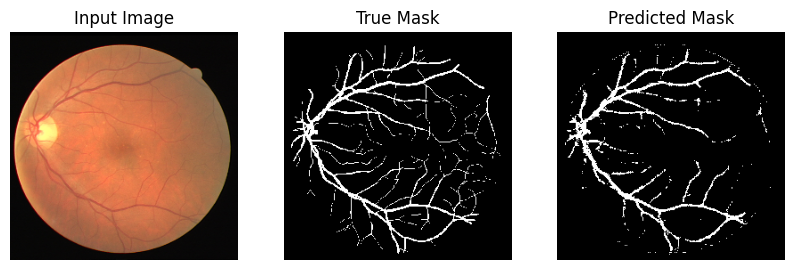


Sample Prediction after epoch 19

5/5 [==============================] - 46s 10s/step - loss: 0.0632 - MIOU: 0.7084 - accuracy: 0.9307 - val_loss: 0.1846 - val_MIOU: 0.7191 - val_accuracy: 0.9452
Epoch 20/60
1/1 [==============================] - 0s 107ms/step


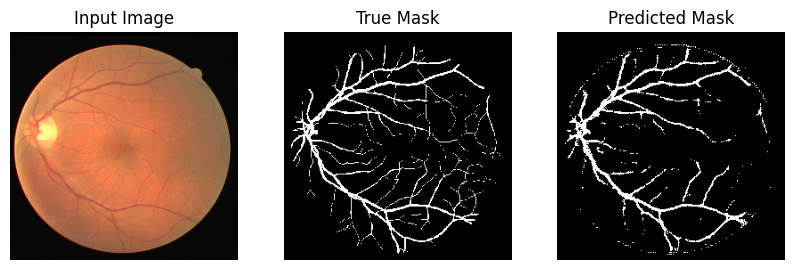


Sample Prediction after epoch 20

5/5 [==============================] - 46s 10s/step - loss: 0.0620 - MIOU: 0.7105 - accuracy: 0.9310 - val_loss: 0.1805 - val_MIOU: 0.7256 - val_accuracy: 0.9473
Epoch 21/60
1/1 [==============================] - 0s 117ms/step


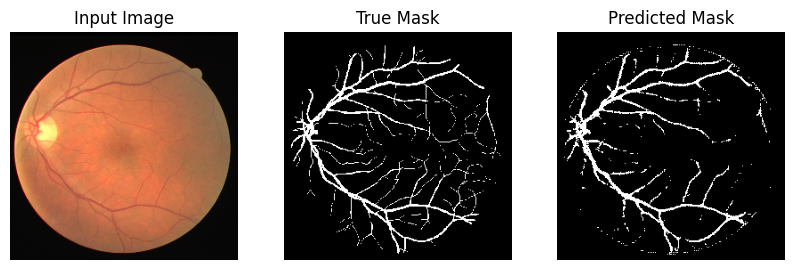


Sample Prediction after epoch 21

5/5 [==============================] - 46s 10s/step - loss: 0.0611 - MIOU: 0.7144 - accuracy: 0.9328 - val_loss: 0.1857 - val_MIOU: 0.7216 - val_accuracy: 0.9452
Epoch 22/60
1/1 [==============================] - 0s 110ms/step


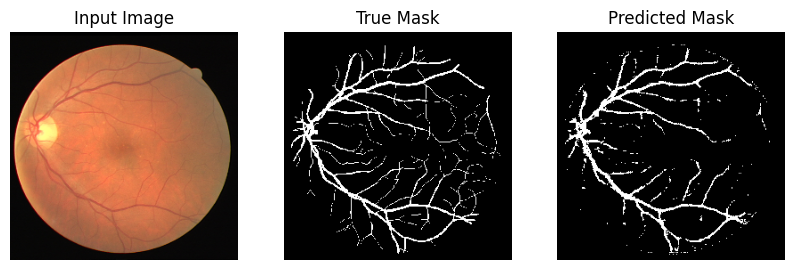


Sample Prediction after epoch 22

5/5 [==============================] - 45s 10s/step - loss: 0.0606 - MIOU: 0.7160 - accuracy: 0.9331 - val_loss: 0.1810 - val_MIOU: 0.7264 - val_accuracy: 0.9460
Epoch 23/60
1/1 [==============================] - 0s 110ms/step


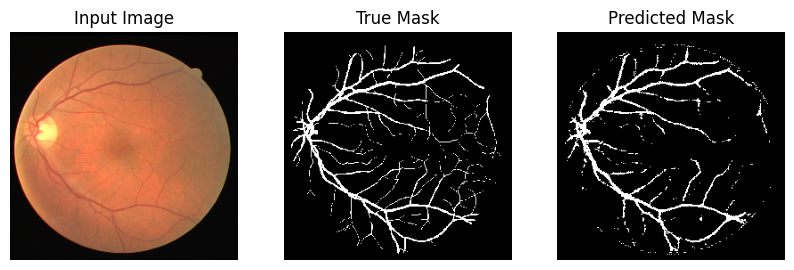


Sample Prediction after epoch 23

5/5 [==============================] - 46s 10s/step - loss: 0.0602 - MIOU: 0.7159 - accuracy: 0.9332 - val_loss: 0.1837 - val_MIOU: 0.7213 - val_accuracy: 0.9451
Epoch 24/60
1/1 [==============================] - 0s 110ms/step


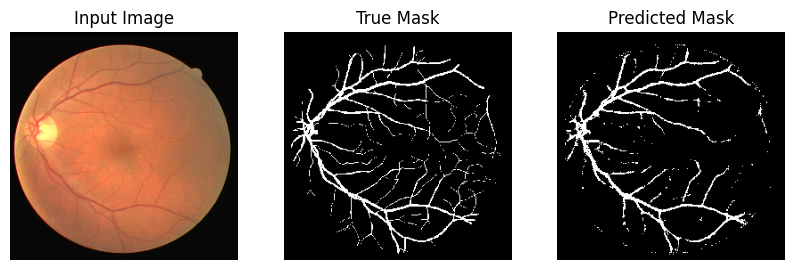


Sample Prediction after epoch 24

5/5 [==============================] - 45s 10s/step - loss: 0.0595 - MIOU: 0.7191 - accuracy: 0.9340 - val_loss: 0.1752 - val_MIOU: 0.7191 - val_accuracy: 0.9470
Epoch 25/60
1/1 [==============================] - 0s 114ms/step


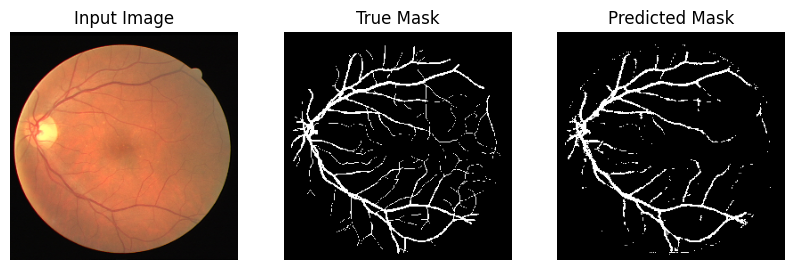


Sample Prediction after epoch 25

5/5 [==============================] - 45s 10s/step - loss: 0.0582 - MIOU: 0.7266 - accuracy: 0.9375 - val_loss: 0.1718 - val_MIOU: 0.7357 - val_accuracy: 0.9488
Epoch 26/60
1/1 [==============================] - 0s 108ms/step


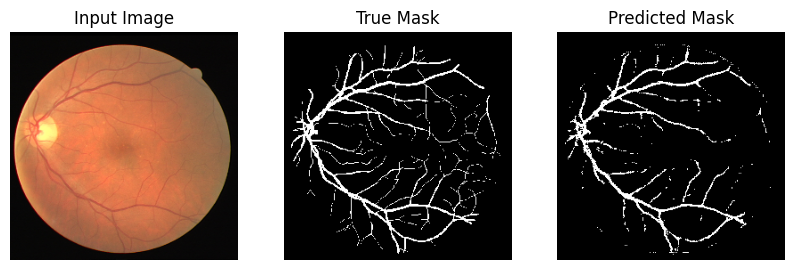


Sample Prediction after epoch 26

5/5 [==============================] - 46s 10s/step - loss: 0.0584 - MIOU: 0.7160 - accuracy: 0.9313 - val_loss: 0.1576 - val_MIOU: 0.7343 - val_accuracy: 0.9504
Epoch 27/60
1/1 [==============================] - 0s 117ms/step


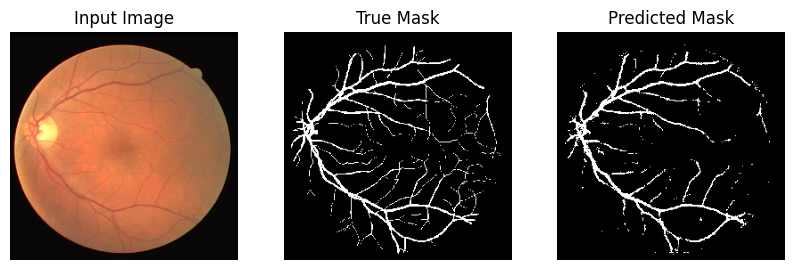


Sample Prediction after epoch 27

5/5 [==============================] - 45s 10s/step - loss: 0.0582 - MIOU: 0.7290 - accuracy: 0.9387 - val_loss: 0.1618 - val_MIOU: 0.7298 - val_accuracy: 0.9501
Epoch 28/60
1/1 [==============================] - 0s 110ms/step


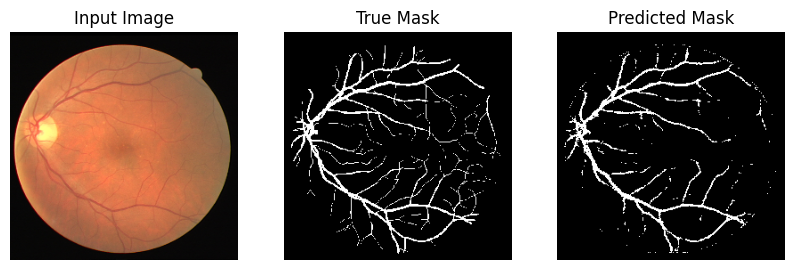


Sample Prediction after epoch 28

5/5 [==============================] - 46s 10s/step - loss: 0.0570 - MIOU: 0.7259 - accuracy: 0.9361 - val_loss: 0.1590 - val_MIOU: 0.7371 - val_accuracy: 0.9495
Epoch 29/60
1/1 [==============================] - 0s 108ms/step


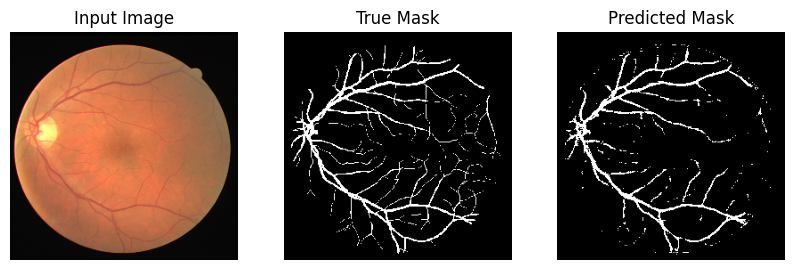


Sample Prediction after epoch 29

5/5 [==============================] - 46s 10s/step - loss: 0.0572 - MIOU: 0.7219 - accuracy: 0.9342 - val_loss: 0.1584 - val_MIOU: 0.7273 - val_accuracy: 0.9496
Epoch 30/60
1/1 [==============================] - 0s 111ms/step


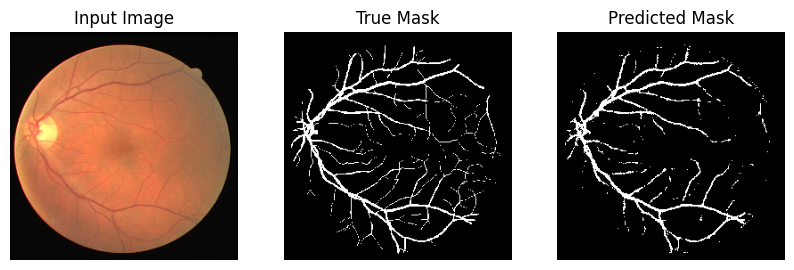


Sample Prediction after epoch 30

5/5 [==============================] - 46s 10s/step - loss: 0.0561 - MIOU: 0.7316 - accuracy: 0.9387 - val_loss: 0.1567 - val_MIOU: 0.7375 - val_accuracy: 0.9510
Epoch 31/60
1/1 [==============================] - 0s 110ms/step


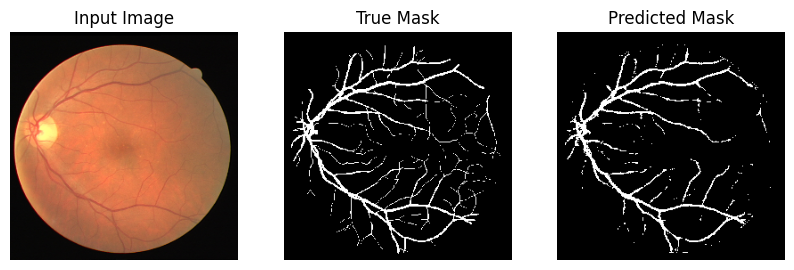


Sample Prediction after epoch 31

5/5 [==============================] - 45s 10s/step - loss: 0.0541 - MIOU: 0.7369 - accuracy: 0.9400 - val_loss: 0.1537 - val_MIOU: 0.7314 - val_accuracy: 0.9504
Epoch 32/60
1/1 [==============================] - 0s 109ms/step


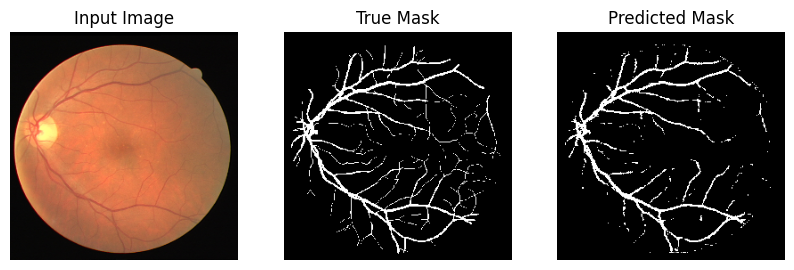


Sample Prediction after epoch 32

5/5 [==============================] - 46s 10s/step - loss: 0.0535 - MIOU: 0.7356 - accuracy: 0.9391 - val_loss: 0.1559 - val_MIOU: 0.7371 - val_accuracy: 0.9503
Epoch 33/60
1/1 [==============================] - 0s 113ms/step


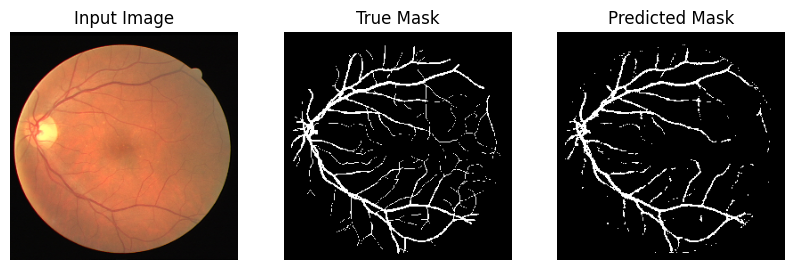


Sample Prediction after epoch 33

5/5 [==============================] - 45s 10s/step - loss: 0.0537 - MIOU: 0.7368 - accuracy: 0.9397 - val_loss: 0.1506 - val_MIOU: 0.7369 - val_accuracy: 0.9518
Epoch 34/60
1/1 [==============================] - 0s 112ms/step


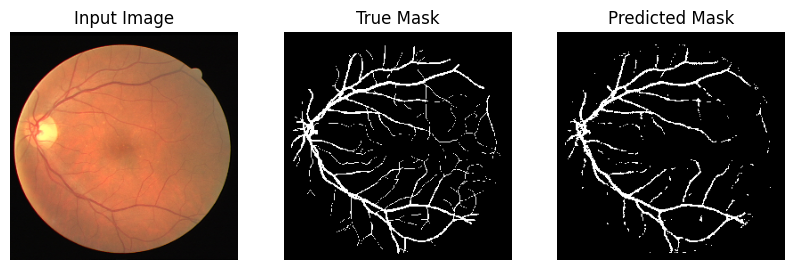


Sample Prediction after epoch 34

5/5 [==============================] - 46s 10s/step - loss: 0.0523 - MIOU: 0.7376 - accuracy: 0.9394 - val_loss: 0.1527 - val_MIOU: 0.7353 - val_accuracy: 0.9493
Epoch 35/60
1/1 [==============================] - 0s 111ms/step


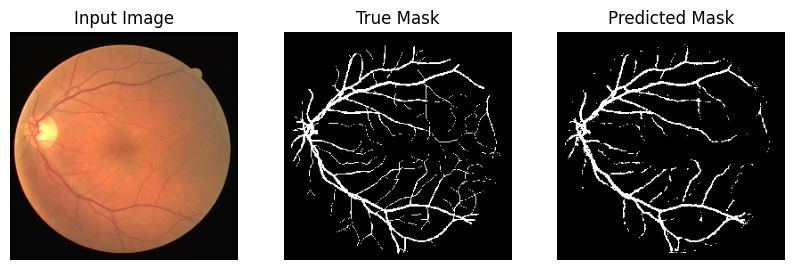


Sample Prediction after epoch 35

5/5 [==============================] - 46s 10s/step - loss: 0.0511 - MIOU: 0.7474 - accuracy: 0.9434 - val_loss: 0.1558 - val_MIOU: 0.7385 - val_accuracy: 0.9494
Epoch 36/60
1/1 [==============================] - 0s 440ms/step


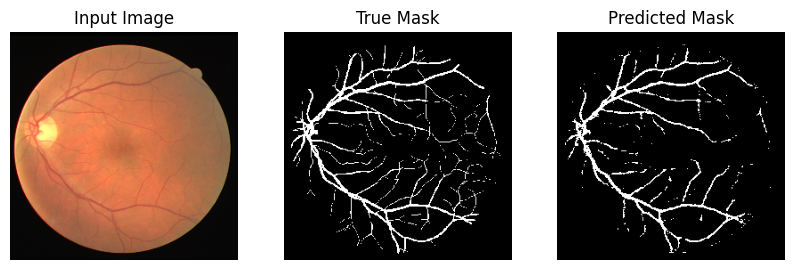


Sample Prediction after epoch 36

5/5 [==============================] - 46s 10s/step - loss: 0.0507 - MIOU: 0.7420 - accuracy: 0.9407 - val_loss: 0.1441 - val_MIOU: 0.7350 - val_accuracy: 0.9521
Epoch 37/60
1/1 [==============================] - 0s 115ms/step


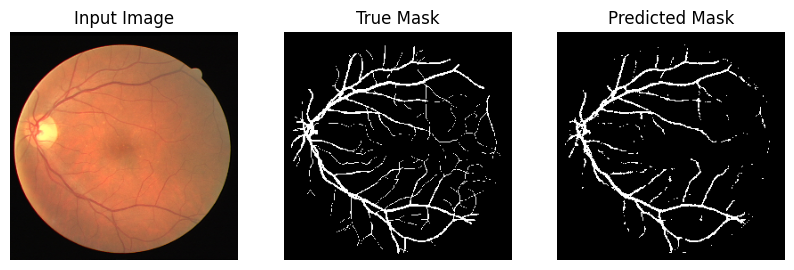


Sample Prediction after epoch 37

5/5 [==============================] - 45s 10s/step - loss: 0.0509 - MIOU: 0.7441 - accuracy: 0.9418 - val_loss: 0.1483 - val_MIOU: 0.7309 - val_accuracy: 0.9504
Epoch 38/60
1/1 [==============================] - 0s 114ms/step


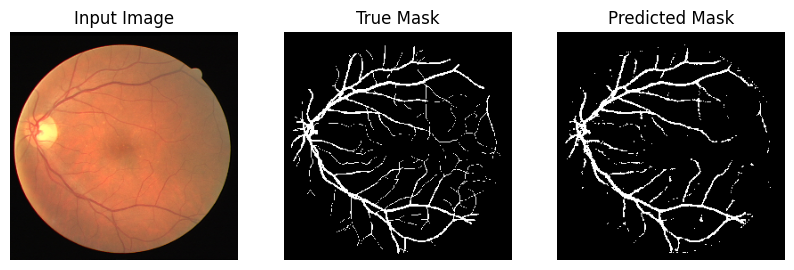


Sample Prediction after epoch 38

5/5 [==============================] - 46s 10s/step - loss: 0.0506 - MIOU: 0.7489 - accuracy: 0.9437 - val_loss: 0.1464 - val_MIOU: 0.7494 - val_accuracy: 0.9513
Epoch 39/60
1/1 [==============================] - 0s 109ms/step


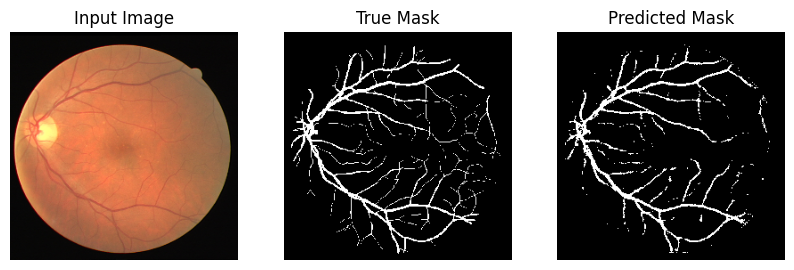


Sample Prediction after epoch 39

5/5 [==============================] - 46s 10s/step - loss: 0.0491 - MIOU: 0.7516 - accuracy: 0.9444 - val_loss: 0.1463 - val_MIOU: 0.7442 - val_accuracy: 0.9508
Epoch 40/60
1/1 [==============================] - 0s 112ms/step


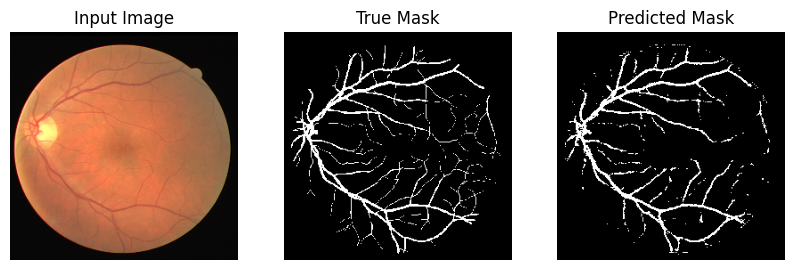


Sample Prediction after epoch 40

5/5 [==============================] - 46s 10s/step - loss: 0.0490 - MIOU: 0.7453 - accuracy: 0.9411 - val_loss: 0.1535 - val_MIOU: 0.7387 - val_accuracy: 0.9488
Epoch 41/60
1/1 [==============================] - 0s 111ms/step


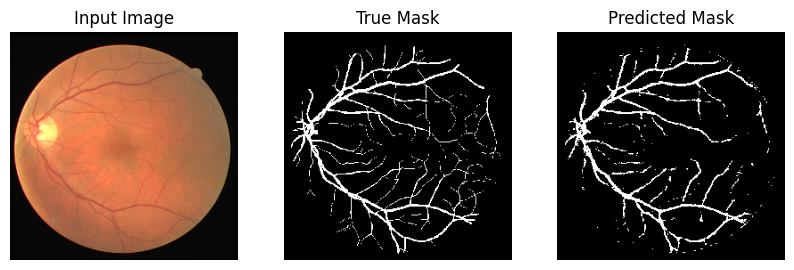


Sample Prediction after epoch 41

5/5 [==============================] - 45s 10s/step - loss: 0.0474 - MIOU: 0.7580 - accuracy: 0.9463 - val_loss: 0.1501 - val_MIOU: 0.7419 - val_accuracy: 0.9493
Epoch 42/60
1/1 [==============================] - 0s 110ms/step


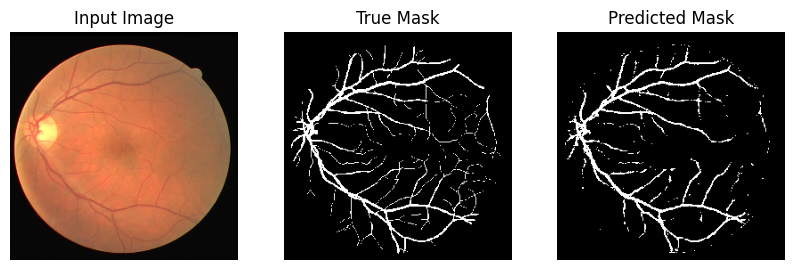


Sample Prediction after epoch 42

5/5 [==============================] - 46s 10s/step - loss: 0.0488 - MIOU: 0.7465 - accuracy: 0.9419 - val_loss: 0.1430 - val_MIOU: 0.7383 - val_accuracy: 0.9509
Epoch 43/60
1/1 [==============================] - 0s 111ms/step


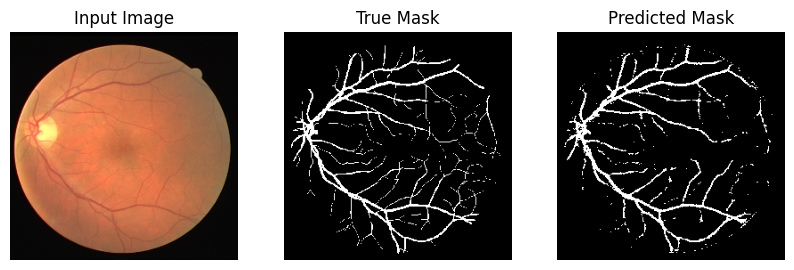


Sample Prediction after epoch 43

5/5 [==============================] - 46s 10s/step - loss: 0.0476 - MIOU: 0.7569 - accuracy: 0.9460 - val_loss: 0.1481 - val_MIOU: 0.7455 - val_accuracy: 0.9491
Epoch 44/60
1/1 [==============================] - 0s 117ms/step


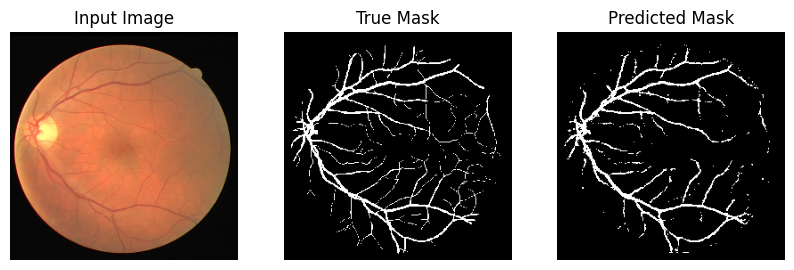


Sample Prediction after epoch 44

5/5 [==============================] - 46s 10s/step - loss: 0.0466 - MIOU: 0.7583 - accuracy: 0.9461 - val_loss: 0.1424 - val_MIOU: 0.7436 - val_accuracy: 0.9502
Epoch 45/60
1/1 [==============================] - 0s 112ms/step


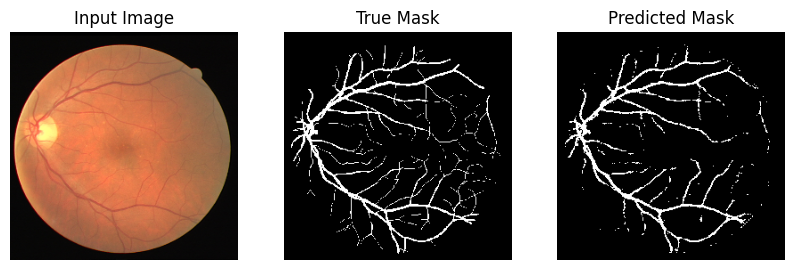


Sample Prediction after epoch 45

5/5 [==============================] - 45s 10s/step - loss: 0.0456 - MIOU: 0.7595 - accuracy: 0.9459 - val_loss: 0.1414 - val_MIOU: 0.7438 - val_accuracy: 0.9506
Epoch 46/60
1/1 [==============================] - 0s 113ms/step


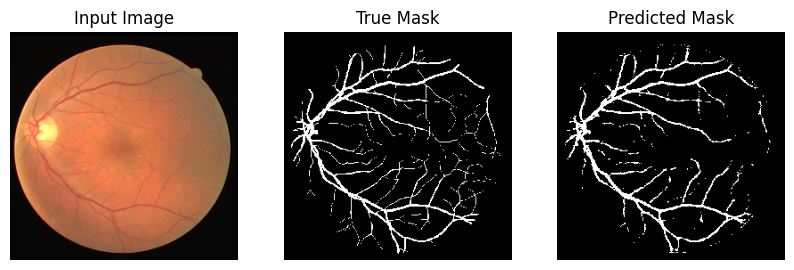


Sample Prediction after epoch 46

5/5 [==============================] - 46s 10s/step - loss: 0.0449 - MIOU: 0.7625 - accuracy: 0.9470 - val_loss: 0.1374 - val_MIOU: 0.7479 - val_accuracy: 0.9510
Epoch 47/60
1/1 [==============================] - 0s 110ms/step


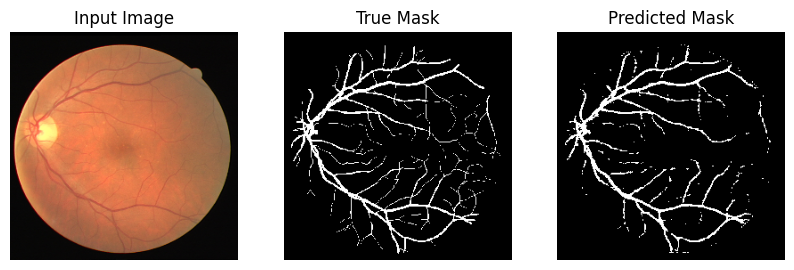


Sample Prediction after epoch 47

5/5 [==============================] - 45s 10s/step - loss: 0.0432 - MIOU: 0.7705 - accuracy: 0.9496 - val_loss: 0.1371 - val_MIOU: 0.7483 - val_accuracy: 0.9517
Epoch 48/60
1/1 [==============================] - 0s 112ms/step


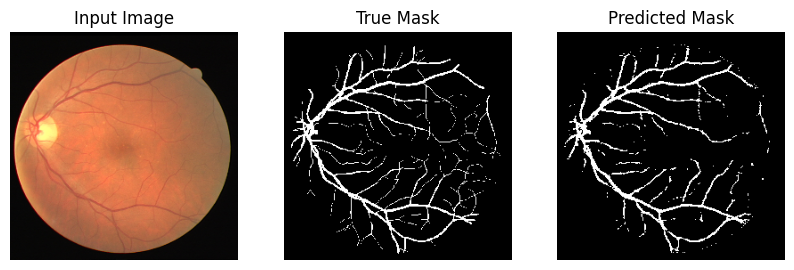


Sample Prediction after epoch 48

5/5 [==============================] - 46s 10s/step - loss: 0.0432 - MIOU: 0.7679 - accuracy: 0.9486 - val_loss: 0.1387 - val_MIOU: 0.7467 - val_accuracy: 0.9514
Epoch 49/60
1/1 [==============================] - 0s 111ms/step


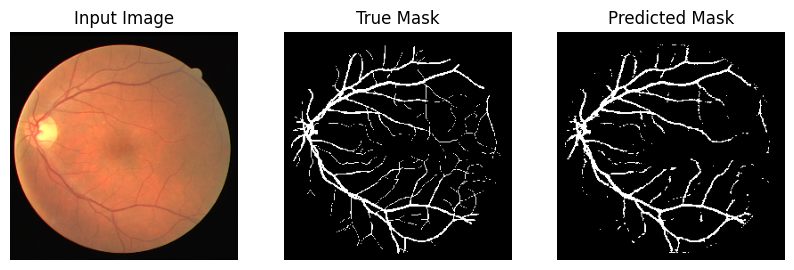


Sample Prediction after epoch 49

5/5 [==============================] - 45s 10s/step - loss: 0.0421 - MIOU: 0.7715 - accuracy: 0.9497 - val_loss: 0.1438 - val_MIOU: 0.7485 - val_accuracy: 0.9492
Epoch 50/60
1/1 [==============================] - 0s 113ms/step


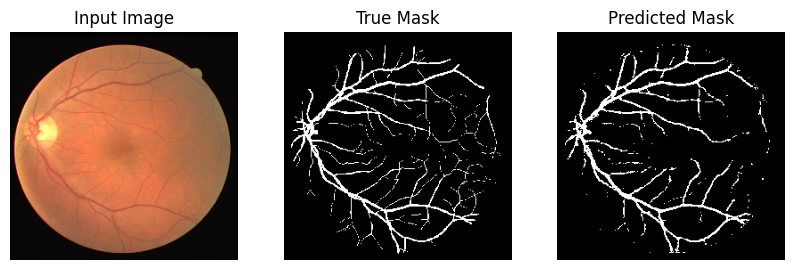


Sample Prediction after epoch 50

5/5 [==============================] - 46s 10s/step - loss: 0.0427 - MIOU: 0.7685 - accuracy: 0.9487 - val_loss: 0.1373 - val_MIOU: 0.7465 - val_accuracy: 0.9507
Epoch 51/60
1/1 [==============================] - 0s 128ms/step


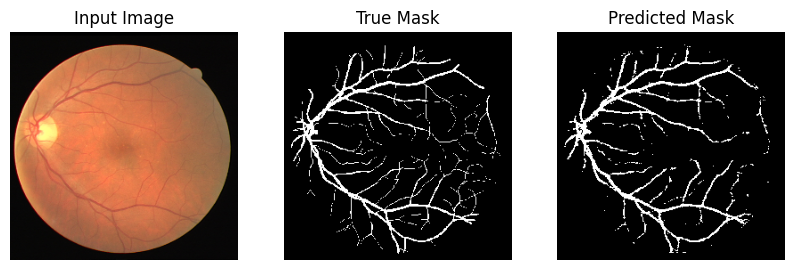


Sample Prediction after epoch 51

5/5 [==============================] - 45s 10s/step - loss: 0.0421 - MIOU: 0.7743 - accuracy: 0.9509 - val_loss: 0.1407 - val_MIOU: 0.7394 - val_accuracy: 0.9499
Epoch 52/60
1/1 [==============================] - 0s 113ms/step


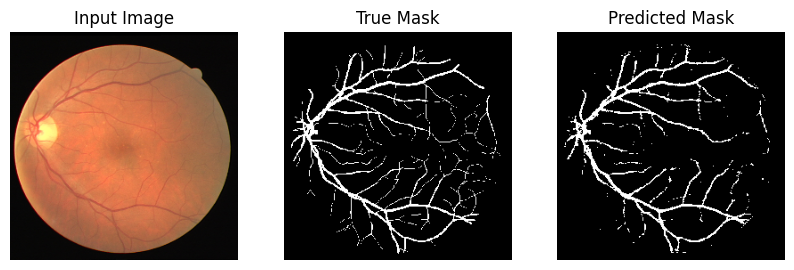


Sample Prediction after epoch 52

5/5 [==============================] - 46s 10s/step - loss: 0.0408 - MIOU: 0.7740 - accuracy: 0.9499 - val_loss: 0.1385 - val_MIOU: 0.7457 - val_accuracy: 0.9508
Epoch 53/60
1/1 [==============================] - 0s 112ms/step


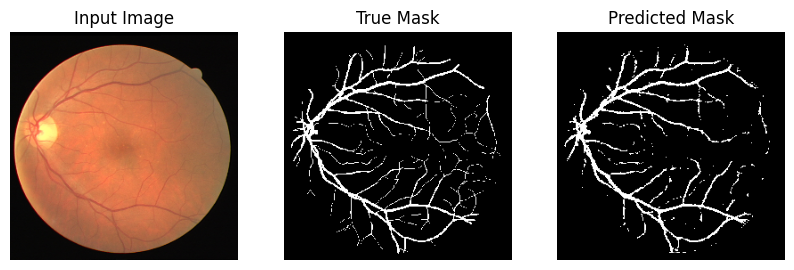


Sample Prediction after epoch 53

5/5 [==============================] - 46s 10s/step - loss: 0.0404 - MIOU: 0.7814 - accuracy: 0.9527 - val_loss: 0.1447 - val_MIOU: 0.7396 - val_accuracy: 0.9472
Epoch 54/60
1/1 [==============================] - 0s 117ms/step


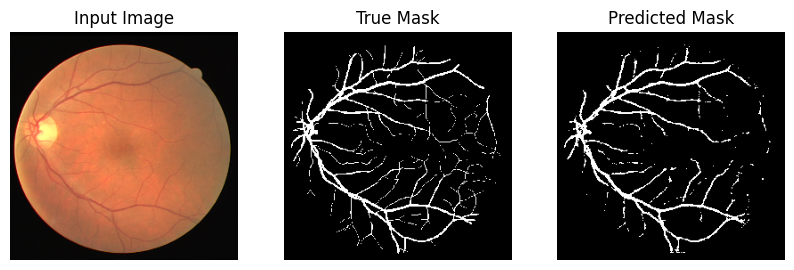


Sample Prediction after epoch 54

5/5 [==============================] - 46s 10s/step - loss: 0.0399 - MIOU: 0.7763 - accuracy: 0.9505 - val_loss: 0.1356 - val_MIOU: 0.7386 - val_accuracy: 0.9516
Epoch 55/60
1/1 [==============================] - 0s 113ms/step


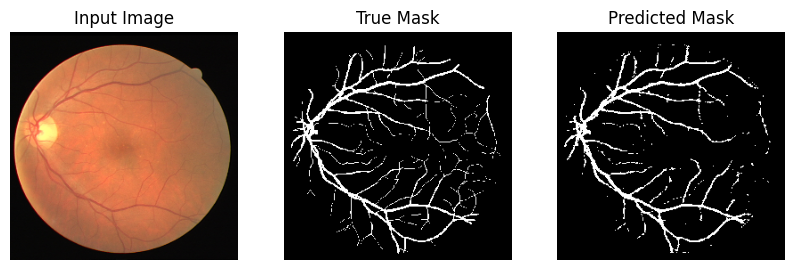


Sample Prediction after epoch 55

5/5 [==============================] - 45s 10s/step - loss: 0.0382 - MIOU: 0.7895 - accuracy: 0.9549 - val_loss: 0.1330 - val_MIOU: 0.7526 - val_accuracy: 0.9520
Epoch 56/60
1/1 [==============================] - 0s 110ms/step


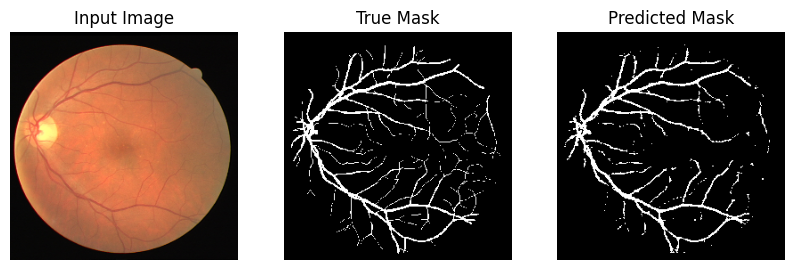


Sample Prediction after epoch 56

5/5 [==============================] - 46s 10s/step - loss: 0.0384 - MIOU: 0.7852 - accuracy: 0.9534 - val_loss: 0.1328 - val_MIOU: 0.7469 - val_accuracy: 0.9517
Epoch 57/60
1/1 [==============================] - 0s 112ms/step


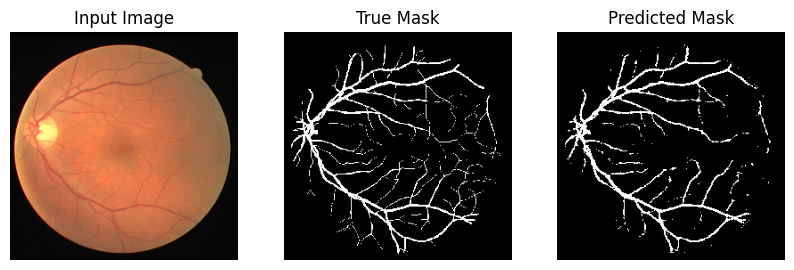


Sample Prediction after epoch 57

5/5 [==============================] - 45s 10s/step - loss: 0.0384 - MIOU: 0.7827 - accuracy: 0.9525 - val_loss: 0.1369 - val_MIOU: 0.7460 - val_accuracy: 0.9509
Epoch 58/60
1/1 [==============================] - 0s 113ms/step


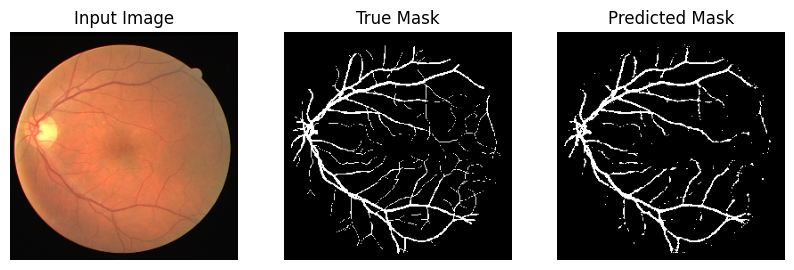


Sample Prediction after epoch 58

5/5 [==============================] - 46s 10s/step - loss: 0.0363 - MIOU: 0.7939 - accuracy: 0.9558 - val_loss: 0.1395 - val_MIOU: 0.7418 - val_accuracy: 0.9493
Epoch 59/60
1/1 [==============================] - 0s 111ms/step


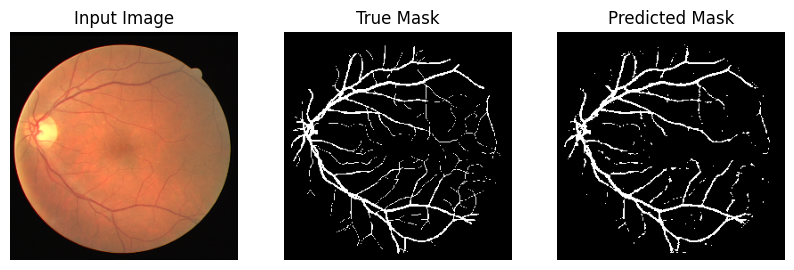


Sample Prediction after epoch 59

5/5 [==============================] - 46s 10s/step - loss: 0.0350 - MIOU: 0.7988 - accuracy: 0.9570 - val_loss: 0.1384 - val_MIOU: 0.7415 - val_accuracy: 0.9514
Epoch 60/60
1/1 [==============================] - 0s 112ms/step


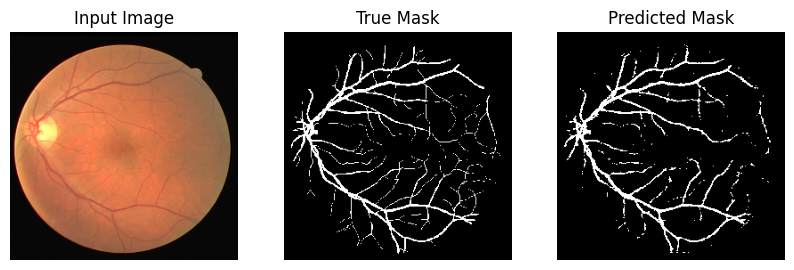


Sample Prediction after epoch 60

5/5 [==============================] - 46s 10s/step - loss: 0.0354 - MIOU: 0.7977 - accuracy: 0.9568 - val_loss: 0.1402 - val_MIOU: 0.7437 - val_accuracy: 0.9496


In [ ]:
from IPython.display import clear_output
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping, TensorBoard
import warnings
warnings.filterwarnings('ignore')

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
#         clear_output(wait=True)
        show_predictions()
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

EPOCHS = 60
VAL_SUBSPLITS = 2
VALIDATION_STEPS = len(dataset)//BATCH_SIZE//VAL_SUBSPLITS
print("VALIDATION_STEPS - ", VALIDATION_STEPS)

def add_sample_weights(image, label):
    # The weights for each class, with the constraint that:
    #     sum(class_weights) == 1.0
    class_weights = tf.constant([1.0, 4.0])
    class_weights = class_weights/tf.reduce_sum(class_weights)

    # Create an image of `sample_weights` by using the label at each pixel as an
    # index into the `class weights` .
    sample_weights = tf.gather(class_weights, indices=tf.cast(label, tf.int32))

    return image, label, sample_weights

model_history = model.fit(
    train_batches.map(add_sample_weights),
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    validation_steps=VALIDATION_STEPS,
    validation_data=test_batches,
    callbacks=[DisplayCallback()]
)

loss = model_history.history['loss']
val_loss = model_history.history['val_loss']
accuracy = model_history.history['accuracy']
val_accuracy = model_history.history['val_accuracy']
miou = model_history.history['MIOU']
val_miou = model_history.history['val_MIOU']





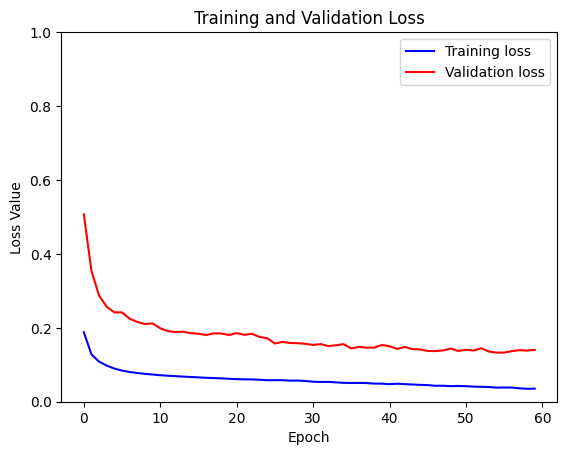

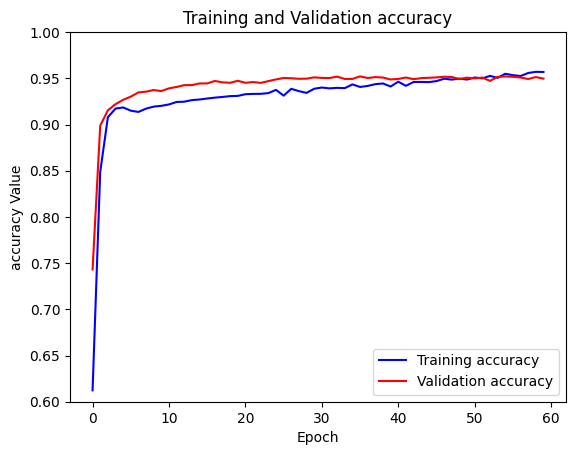

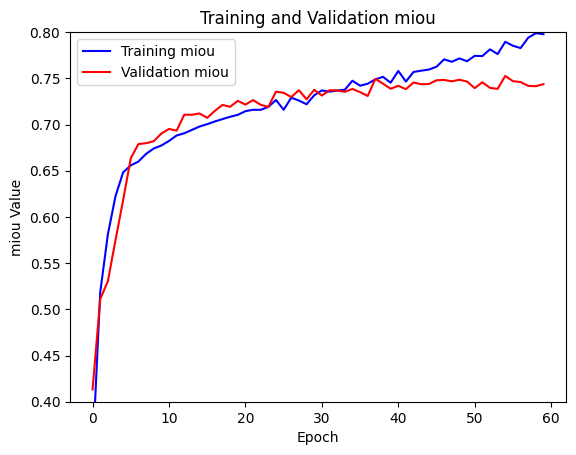

1/1 [==============================] - 0s 113ms/step


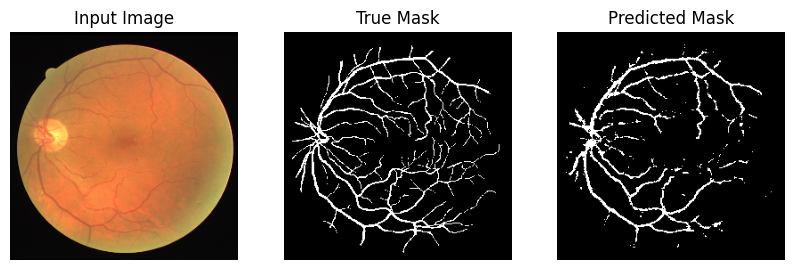

1/1 [==============================] - 0s 111ms/step


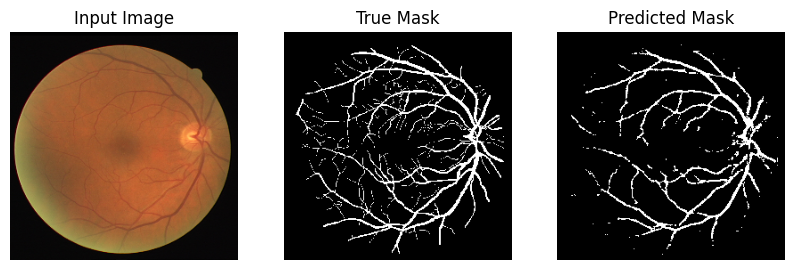

1/1 [==============================] - 0s 113ms/step


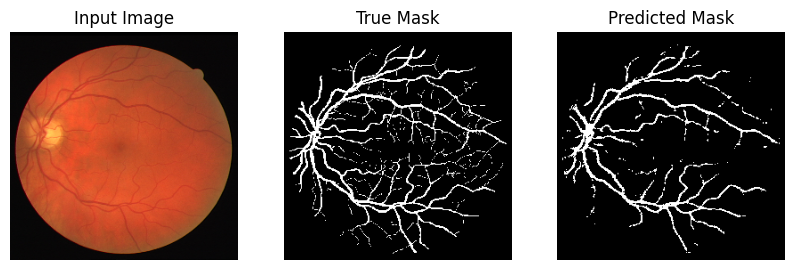

In [ ]:
plt.figure()
plt.plot(model_history.epoch, loss, 'b', label='Training loss')
plt.plot(model_history.epoch, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()


plt.figure()
plt.plot(model_history.epoch, accuracy, 'b', label='Training accuracy')
plt.plot(model_history.epoch, val_accuracy, 'r', label='Validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('accuracy Value')
plt.ylim([0.6, 1])
plt.legend()
plt.show()


plt.figure()
plt.plot(model_history.epoch, miou, 'b', label='Training miou')
plt.plot(model_history.epoch, val_miou, 'r', label='Validation miou')
plt.title('Training and Validation miou')
plt.xlabel('Epoch')
plt.ylabel('miou Value')
plt.ylim([0.4, 0.8])
plt.legend()
plt.show()

show_predictions(test_batches, 3)
